In [1]:
import tensorflow as tf
import torch
import pandas as pd
from darts import TimeSeries
from darts.models import ExponentialSmoothing
from darts.models import LightGBMModel, TFTModel, NBEATSModel
from darts.metrics import rmse, mae, mape

In [2]:
df_test = pd.read_csv("C:/Users/au_wa/OneDrive/Desktop/GoSoft Test/demand-forecasting (Name) (4) (2) - (2) (1)/demand-forecasting/test.csv", parse_dates=["date"])
df_train = pd.read_csv("C:/Users/au_wa/OneDrive/Desktop/GoSoft Test/demand-forecasting (Name) (4) (2) - (2) (1)/demand-forecasting/train.csv", parse_dates=["date"])

In [3]:
print(df_test)

          id       date  store  item
0          0 2018-01-01      1     1
1          1 2018-01-02      1     1
2          2 2018-01-03      1     1
3          3 2018-01-04      1     1
4          4 2018-01-05      1     1
...      ...        ...    ...   ...
44995  44995 2018-03-27     10    50
44996  44996 2018-03-28     10    50
44997  44997 2018-03-29     10    50
44998  44998 2018-03-30     10    50
44999  44999 2018-03-31     10    50

[45000 rows x 4 columns]


In [4]:
print(df_train)

             date  store  item  sales
0      2013-01-01      1     1     13
1      2013-01-02      1     1     11
2      2013-01-03      1     1     14
3      2013-01-04      1     1     13
4      2013-01-05      1     1     10
...           ...    ...   ...    ...
912995 2017-12-27     10    50     63
912996 2017-12-28     10    50     59
912997 2017-12-29     10    50     74
912998 2017-12-30     10    50     62
912999 2017-12-31     10    50     82

[913000 rows x 4 columns]


In [5]:
print(df_train.isnull().sum())

date     0
store    0
item     0
sales    0
dtype: int64


In [6]:
print(df_test.isnull().sum())

id       0
date     0
store    0
item     0
dtype: int64


In [7]:
duplicates = df_train[df_train.duplicated(subset=["date", "store", "item"], keep=False)]
print(duplicates)

Empty DataFrame
Columns: [date, store, item, sales]
Index: []


In [8]:
def count_missing_dates_per_store_item(df):

    df['date'] = pd.to_datetime(df['date'])

    # Create a complete date range
    all_dates = pd.date_range(start=df['date'].min(), end=df['date'].max(), freq='D')

    def count_missing(group):
        group_dates = group['date'].dt.date.unique() #get unique dates for each group.
        missing_dates = all_dates.difference(pd.to_datetime(group_dates))
        return len(missing_dates)

    result = df.groupby(['store', 'item']).apply(count_missing).reset_index(name='num')
    return result

In [9]:
missing_counts = count_missing_dates_per_store_item(df_train)

filtered_missing_counts = missing_counts[missing_counts['num'] > 0]

print(filtered_missing_counts)

Empty DataFrame
Columns: [store, item, num]
Index: []


C:\Users\au_wa\AppData\Local\Temp\ipykernel_21596\2244487043.py:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  result = df.groupby(['store', 'item']).apply(count_missing).reset_index(name='num')


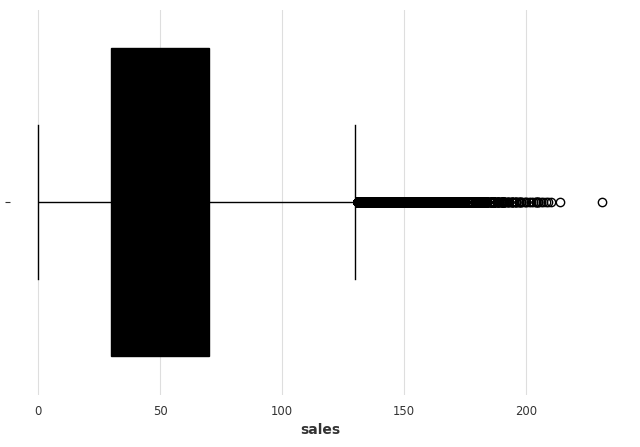

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
sns.boxplot(x=df_train["sales"])
plt.show()

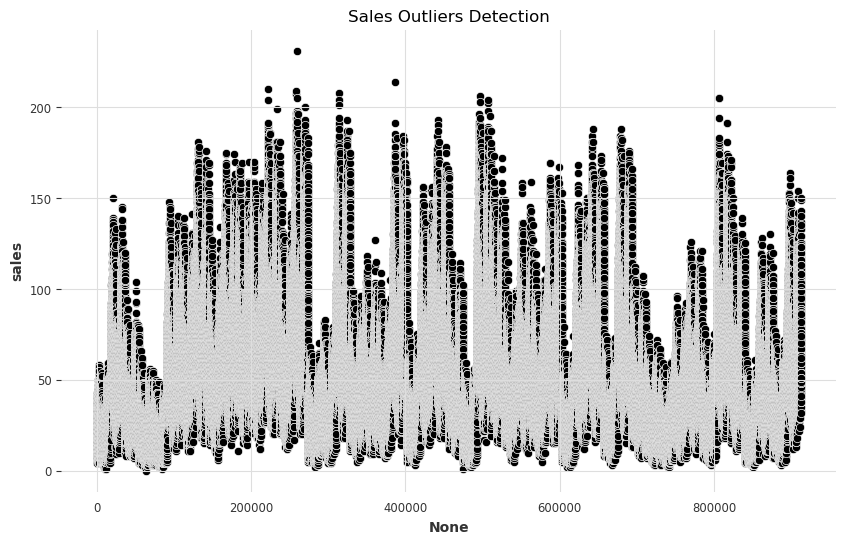

In [11]:
plt.figure(figsize=(10,6))
sns.scatterplot(x=df_train.index, y=df_train["sales"])
plt.title("Sales Outliers Detection")
plt.show()

In [12]:
Q1 = df_train["sales"].quantile(0.25)  # First quartile (25th percentile)
Q3 = df_train["sales"].quantile(0.75)  # Third quartile (75th percentile)
IQR = Q3-Q1  # Interquartile range
print("Q1=",Q1)
print("Q3=",Q3)

# Define bounds for outliers
lower_bound = Q1-(1.5*IQR)
print("lower bound=",lower_bound)
upper_bound = Q3+(1.5*IQR)
print("upper bound=",upper_bound)


Q1= 30.0
Q3= 70.0
lower bound= -30.0
upper bound= 130.0


In [13]:
lower_bound = 0

# Find outliers
outliers = df_train[(df_train["sales"]<lower_bound) | (df_train["sales"]>upper_bound)]
print(outliers)

             date  store  item  sales
21330  2016-05-29      2     2    139
21344  2016-06-12      2     2    131
21365  2016-07-03      2     2    138
21372  2016-07-10      2     2    134
21399  2016-08-06      2     2    136
...           ...    ...   ...    ...
912796 2017-06-11     10    50    137
912803 2017-06-18     10    50    150
912824 2017-07-09     10    50    135
912831 2017-07-16     10    50    143
912838 2017-07-23     10    50    140

[11967 rows x 4 columns]


In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_item_correlation(df, store_id):

    df_store = df[df["store"] == store_id].pivot(index="date", columns="item", values="sales")
    corr_matrix = df_store.corr()

    plt.figure(figsize=(40, 24))
    sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
    plt.title(f"Sales Correlation Between Items in Store {store_id}")
    plt.show()

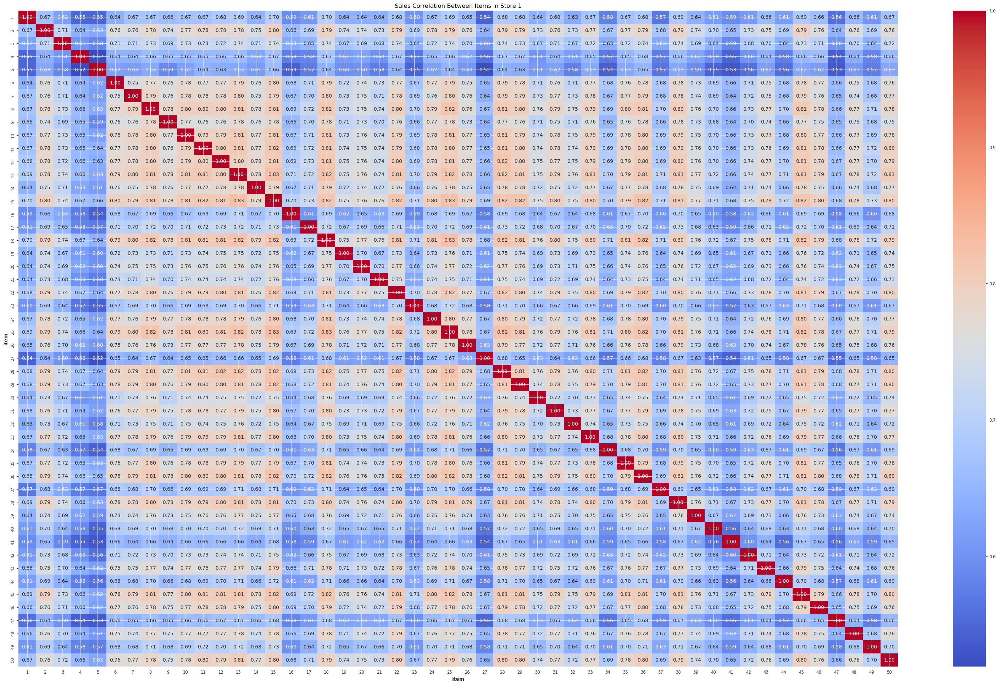

In [15]:
plot_item_correlation(df_train, store_id=1)

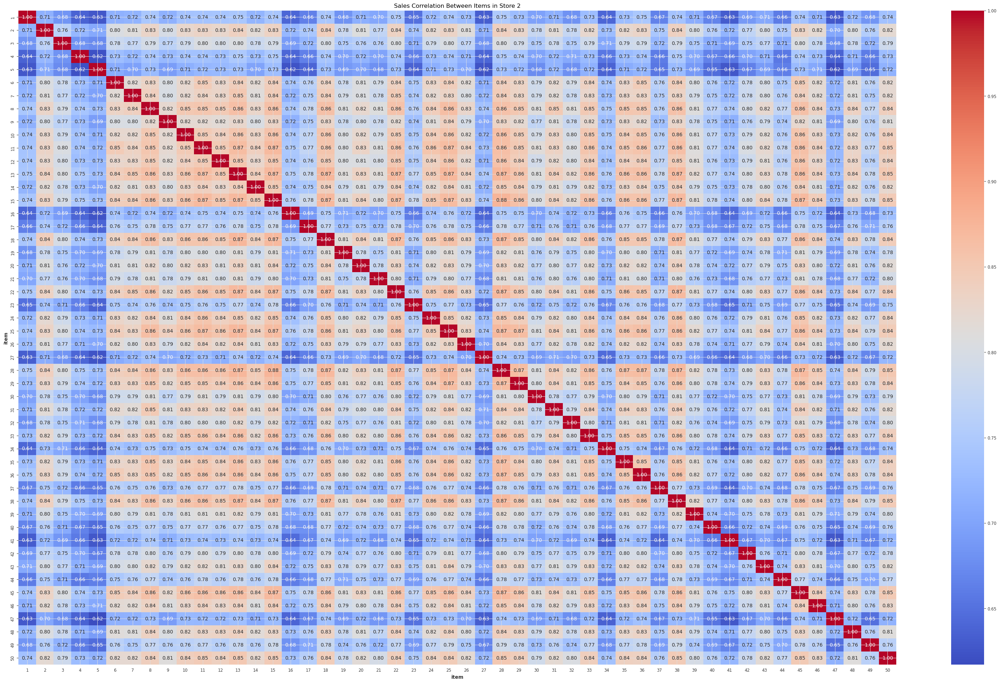

In [16]:
plot_item_correlation(df_train, store_id=2)

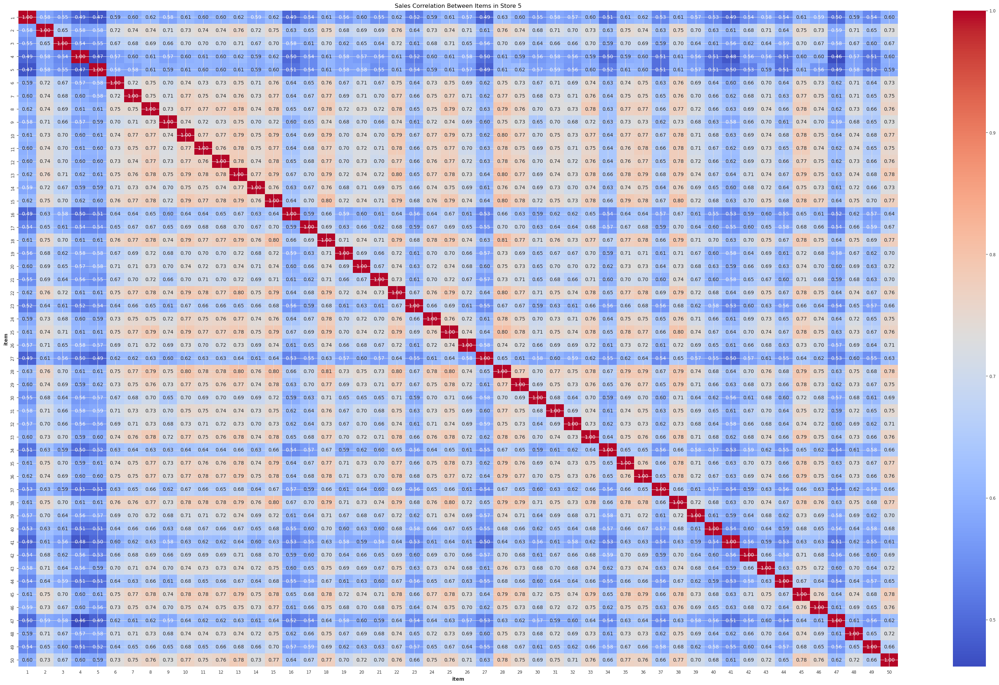

In [17]:
plot_item_correlation(df_train, store_id=5)

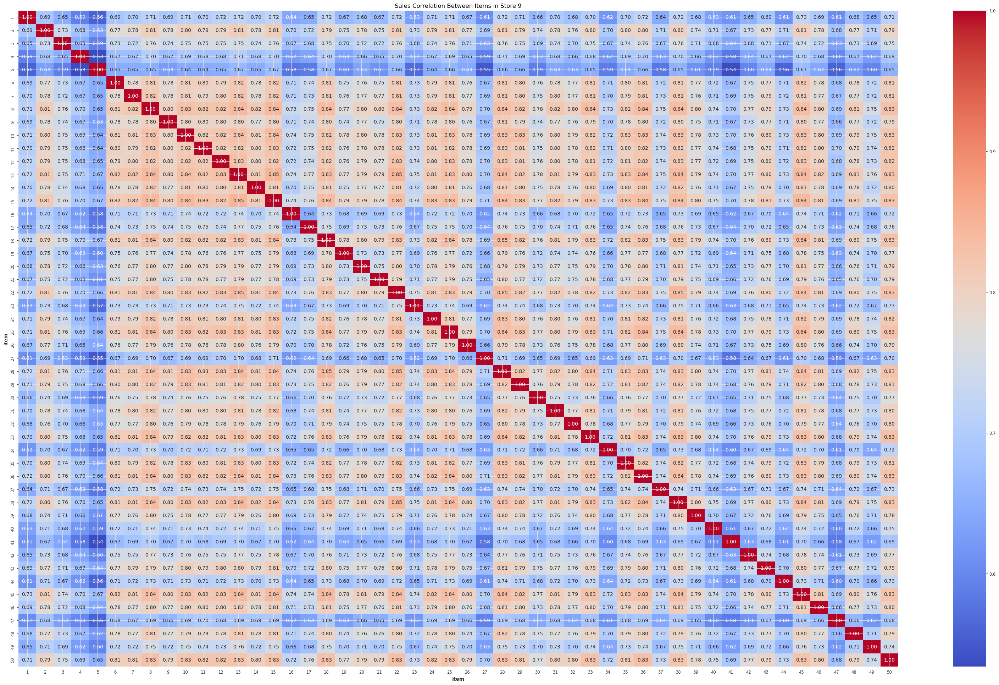

In [18]:
plot_item_correlation(df_train, store_id=9)

In [19]:
def plot_store_correlation(df, item_id):
    
    df_item = df[df["item"] == item_id].pivot(index="date", columns="store", values="sales")
    corr_matrix = df_item.corr()

    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
    plt.title(f"Sales Correlation Between Stores for Item {item_id}")
    plt.show()

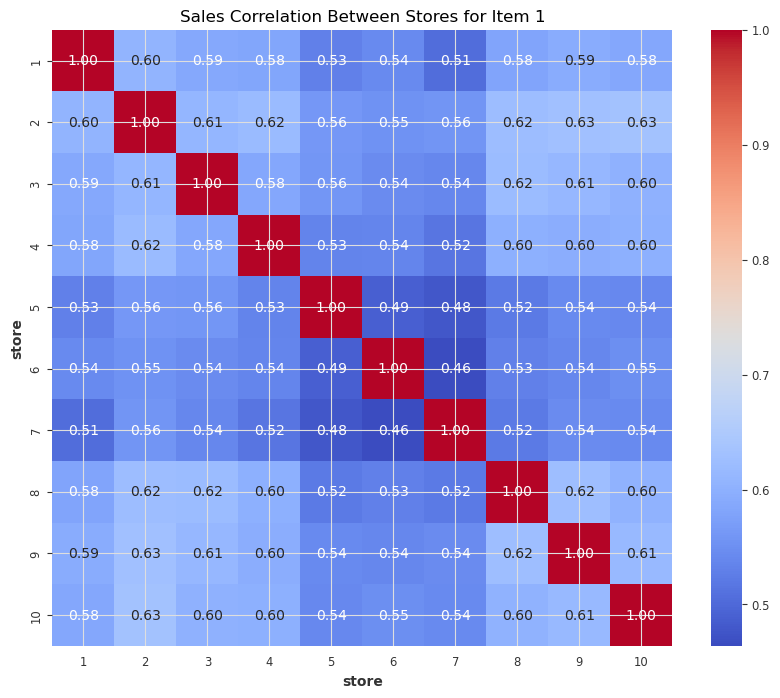

In [20]:
plot_store_correlation(df_train, item_id=1)

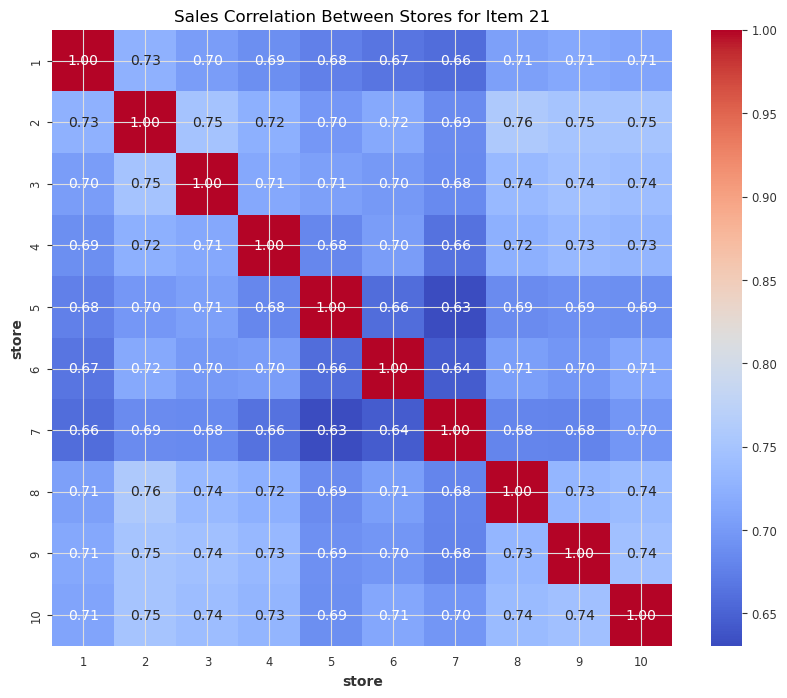

In [21]:
plot_store_correlation(df_train, item_id=21)

In [22]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

def cluster_stores_by_item(df, item_id, max_clusters=10):

    df_item = df[df["item"] == item_id].pivot(index="date", columns="store", values="sales").fillna(0)
    
    # Normalize data
    scaler = StandardScaler()
    sales_scaled = scaler.fit_transform(df_item.T)

    # Elbow Method to find the optimal number of clusters
    wcss = []  
    K_range = range(1, max_clusters + 1)

    for k in K_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(sales_scaled)
        wcss.append(kmeans.inertia_)

    # Plot the Elbow Curve
    plt.figure(figsize=(8, 5))
    plt.plot(K_range, wcss, marker="o", linestyle="-")
    plt.xlabel("Number of Clusters")
    plt.ylabel("WCSS (Within-Cluster Sum of Squares)")
    plt.title(f"Elbow Method for Item {item_id}")
    plt.show()

    # Determine optimal clusters (you can modify this to select automatically)
    optimal_clusters = int(input("Enter the optimal number of clusters based on the elbow plot: "))

    # Apply K-Means with the chosen number of clusters
    kmeans = KMeans(n_clusters=optimal_clusters, random_state=42, n_init=10)
    clusters = kmeans.fit_predict(sales_scaled)

    # Assign cluster labels
    store_clusters = pd.DataFrame({"store": df_item.columns, "cluster": clusters})
    
    return store_clusters


C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Window

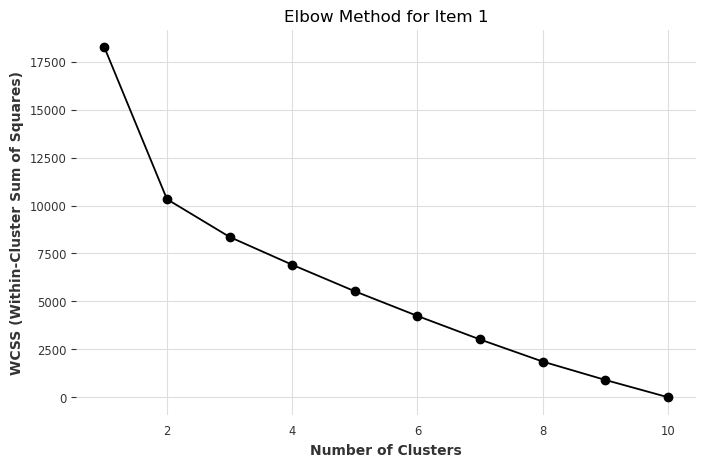

Enter the optimal number of clusters based on the elbow plot:  2


   store  cluster
0      1        0
1      2        1
2      3        1
3      4        1
4      5        0
5      6        0
6      7        0
7      8        1
8      9        1
9     10        1


C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [23]:
cluster_result = cluster_stores_by_item(df_train, item_id=1)
print(cluster_result)

In [24]:
def cluster_item_by_store(df, store_id, max_clusters=10):
   
    df_store = df[df["store"] == store_id].pivot(index="date", columns="item", values="sales").fillna(0)
    
    # Normalize data
    scaler = StandardScaler()
    sales_scaled = scaler.fit_transform(df_store.T)

    # Elbow Method to find the optimal number of clusters
    wcss = [] 
    K_range = range(1, max_clusters + 1)

    for k in K_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(sales_scaled)
        wcss.append(kmeans.inertia_)

    # Plot the Elbow Curve
    plt.figure(figsize=(8, 5))
    plt.plot(K_range, wcss, marker="o", linestyle="-")
    plt.xlabel("Number of Clusters")
    plt.ylabel("WCSS (Within-Cluster Sum of Squares)")
    plt.title(f"Elbow Method for Store {store_id}")
    plt.show()

    # Determine optimal clusters (you can modify this to select automatically)
    optimal_clusters = int(input("Enter the optimal number of clusters based on the elbow plot: "))

    # Apply K-Means with the chosen number of clusters
    kmeans = KMeans(n_clusters=optimal_clusters, random_state=42, n_init=10)
    clusters = kmeans.fit_predict(sales_scaled)

    # Assign cluster labels
    item_clusters = pd.DataFrame({"item": df_store.columns, "cluster": clusters})
    
    return item_clusters

C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Window

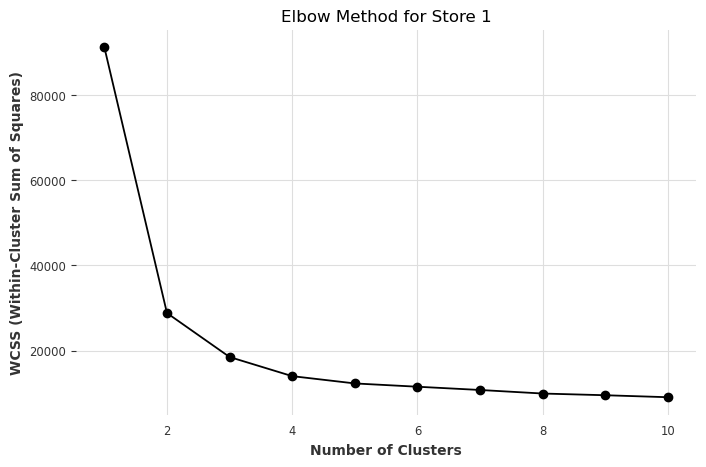

Enter the optimal number of clusters based on the elbow plot:  2


    item  cluster
0      1        0
1      2        1
2      3        0
3      4        0
4      5        0
5      6        1
6      7        1
7      8        1
8      9        0
9     10        1
10    11        1
11    12        1
12    13        1
13    14        1
14    15        1
15    16        0
16    17        0
17    18        1
18    19        0
19    20        0
20    21        0
21    22        1
22    23        0
23    24        1
24    25        1
25    26        0
26    27        0
27    28        1
28    29        1
29    30        0
30    31        1
31    32        0
32    33        1
33    34        0
34    35        1
35    36        1
36    37        0
37    38        1
38    39        0
39    40        0
40    41        0
41    42        0
42    43        0
43    44        0
44    45        1
45    46        1
46    47        0
47    48        0
48    49        0
49    50        1


C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [25]:
cluster_result_1 = cluster_item_by_store(df_train, store_id=1)
print(cluster_result_1)

C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Window

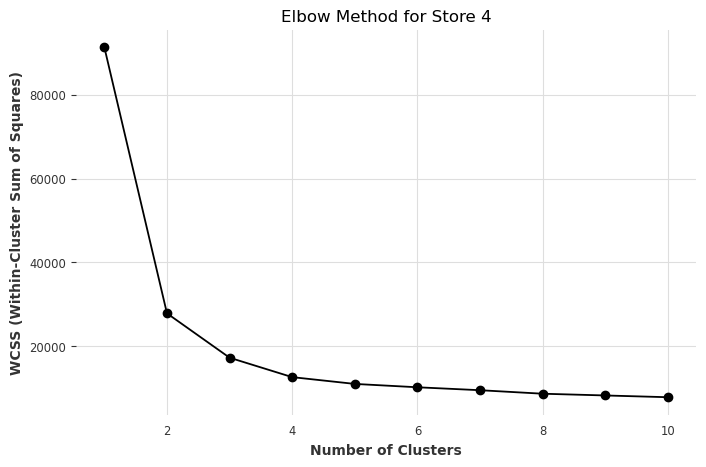

Enter the optimal number of clusters based on the elbow plot:  2


    item  cluster
0      1        0
1      2        1
2      3        0
3      4        0
4      5        0
5      6        1
6      7        1
7      8        1
8      9        0
9     10        1
10    11        1
11    12        1
12    13        1
13    14        1
14    15        1
15    16        0
16    17        0
17    18        1
18    19        0
19    20        0
20    21        0
21    22        1
22    23        0
23    24        1
24    25        1
25    26        0
26    27        0
27    28        1
28    29        1
29    30        0
30    31        1
31    32        0
32    33        1
33    34        0
34    35        1
35    36        1
36    37        0
37    38        1
38    39        0
39    40        0
40    41        0
41    42        0
42    43        0
43    44        0
44    45        1
45    46        1
46    47        0
47    48        0
48    49        0
49    50        1


C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [26]:
cluster_result_4 = cluster_item_by_store(df_train, store_id=4)
print(cluster_result_4)

C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Window

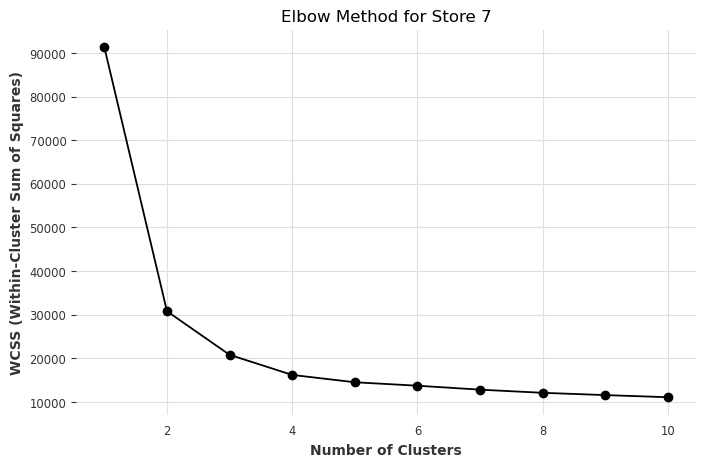

Enter the optimal number of clusters based on the elbow plot:  2


    item  cluster
0      1        0
1      2        1
2      3        0
3      4        0
4      5        0
5      6        1
6      7        1
7      8        1
8      9        0
9     10        1
10    11        1
11    12        1
12    13        1
13    14        1
14    15        1
15    16        0
16    17        0
17    18        1
18    19        0
19    20        0
20    21        0
21    22        1
22    23        0
23    24        1
24    25        1
25    26        0
26    27        0
27    28        1
28    29        1
29    30        0
30    31        1
31    32        0
32    33        1
33    34        0
34    35        1
35    36        1
36    37        0
37    38        1
38    39        0
39    40        0
40    41        0
41    42        0
42    43        0
43    44        0
44    45        1
45    46        1
46    47        0
47    48        0
48    49        0
49    50        1


C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [27]:
cluster_result_7 = cluster_item_by_store(df_train, store_id=7)
print(cluster_result_7)

C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Window

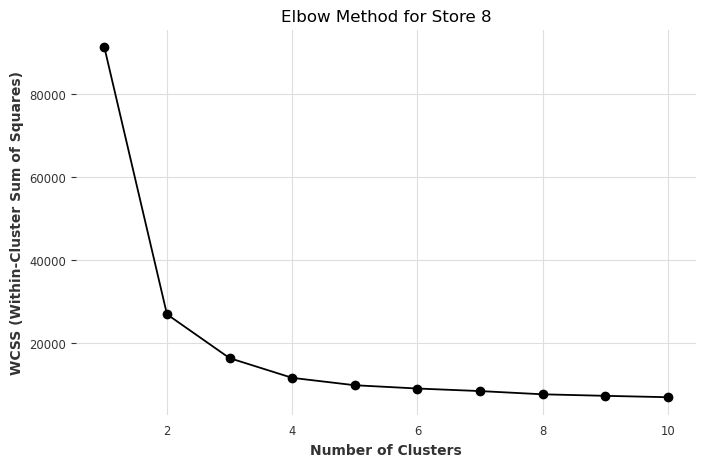

Enter the optimal number of clusters based on the elbow plot:  2


    item  cluster
0      1        0
1      2        1
2      3        0
3      4        0
4      5        0
5      6        1
6      7        1
7      8        1
8      9        0
9     10        1
10    11        1
11    12        1
12    13        1
13    14        1
14    15        1
15    16        0
16    17        0
17    18        1
18    19        0
19    20        0
20    21        0
21    22        1
22    23        0
23    24        1
24    25        1
25    26        0
26    27        0
27    28        1
28    29        1
29    30        0
30    31        1
31    32        0
32    33        1
33    34        0
34    35        1
35    36        1
36    37        0
37    38        1
38    39        0
39    40        0
40    41        0
41    42        0
42    43        0
43    44        0
44    45        1
45    46        1
46    47        0
47    48        0
48    49        0
49    50        1


C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [28]:
cluster_result_8 = cluster_item_by_store(df_train, store_id=8)
print(cluster_result_8)

C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Window

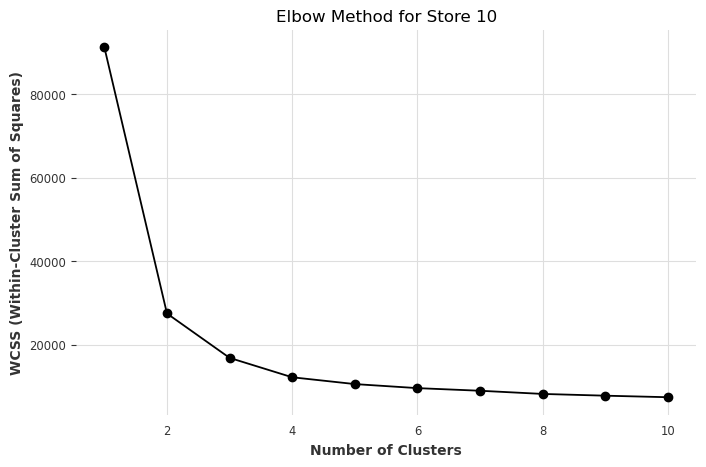

Enter the optimal number of clusters based on the elbow plot:  2


    item  cluster
0      1        0
1      2        1
2      3        0
3      4        0
4      5        0
5      6        1
6      7        1
7      8        1
8      9        0
9     10        1
10    11        1
11    12        1
12    13        1
13    14        1
14    15        1
15    16        0
16    17        0
17    18        1
18    19        0
19    20        0
20    21        0
21    22        1
22    23        0
23    24        1
24    25        1
25    26        0
26    27        0
27    28        1
28    29        1
29    30        0
30    31        1
31    32        0
32    33        1
33    34        0
34    35        1
35    36        1
36    37        0
37    38        1
38    39        0
39    40        0
40    41        0
41    42        0
42    43        0
43    44        0
44    45        1
45    46        1
46    47        0
47    48        0
48    49        0
49    50        1


C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [29]:
cluster_result_10 = cluster_item_by_store(df_train, store_id=10)
print(cluster_result_10)

C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Window

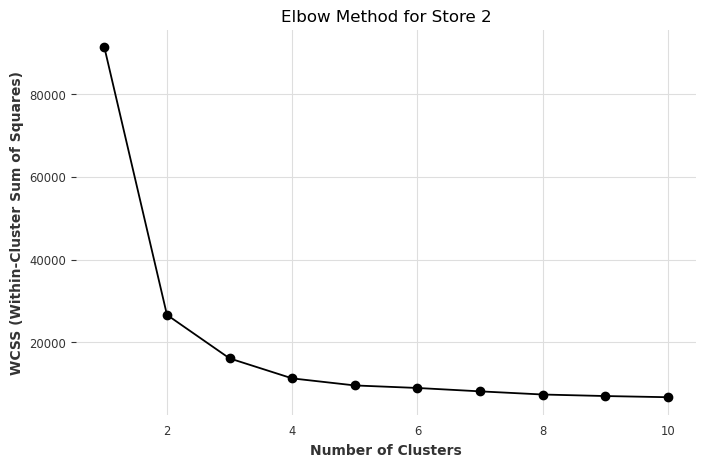

Enter the optimal number of clusters based on the elbow plot:  2


    item  cluster
0      1        0
1      2        1
2      3        0
3      4        0
4      5        0
5      6        1
6      7        1
7      8        1
8      9        0
9     10        1
10    11        1
11    12        1
12    13        1
13    14        1
14    15        1
15    16        0
16    17        0
17    18        1
18    19        0
19    20        0
20    21        0
21    22        1
22    23        0
23    24        1
24    25        1
25    26        0
26    27        0
27    28        1
28    29        1
29    30        0
30    31        1
31    32        0
32    33        1
33    34        0
34    35        1
35    36        1
36    37        0
37    38        1
38    39        0
39    40        0
40    41        0
41    42        0
42    43        0
43    44        0
44    45        1
45    46        1
46    47        0
47    48        0
48    49        0
49    50        1


C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [30]:
cluster_result_2 = cluster_item_by_store(df_train, store_id=2)
print(cluster_result_2)

C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Window

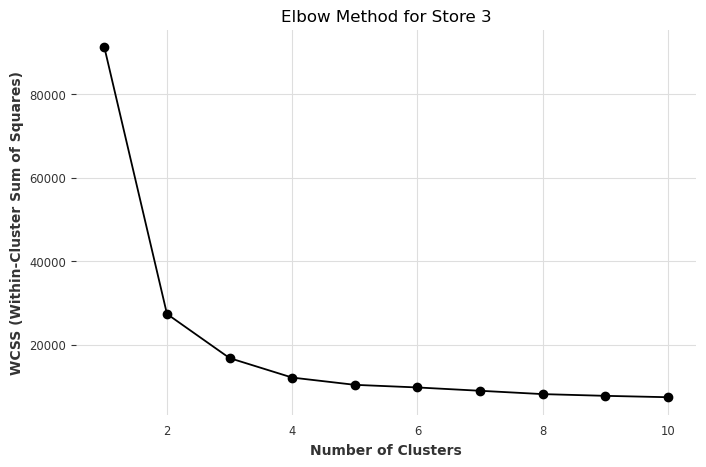

Enter the optimal number of clusters based on the elbow plot:  2


    item  cluster
0      1        0
1      2        1
2      3        0
3      4        0
4      5        0
5      6        1
6      7        1
7      8        1
8      9        0
9     10        1
10    11        1
11    12        1
12    13        1
13    14        1
14    15        1
15    16        0
16    17        0
17    18        1
18    19        0
19    20        0
20    21        0
21    22        1
22    23        0
23    24        1
24    25        1
25    26        0
26    27        0
27    28        1
28    29        1
29    30        0
30    31        1
31    32        0
32    33        1
33    34        0
34    35        1
35    36        1
36    37        0
37    38        1
38    39        0
39    40        0
40    41        0
41    42        0
42    43        0
43    44        0
44    45        1
45    46        1
46    47        0
47    48        0
48    49        0
49    50        1


C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [31]:
cluster_result_3 = cluster_item_by_store(df_train, store_id=3)
print(cluster_result_3)

C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Window

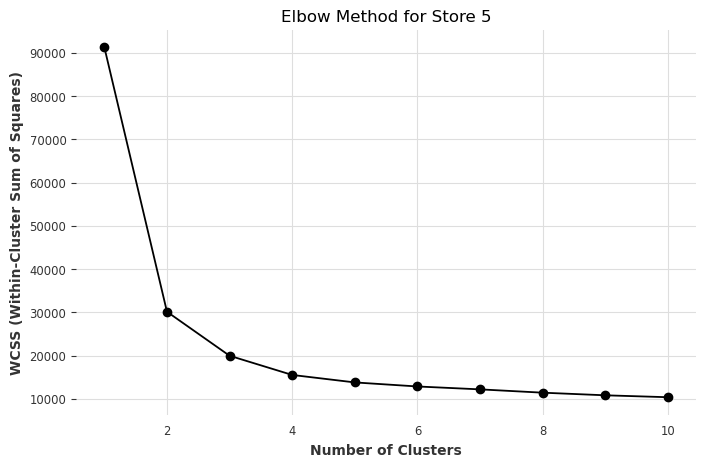

Enter the optimal number of clusters based on the elbow plot:  2


    item  cluster
0      1        0
1      2        1
2      3        0
3      4        0
4      5        0
5      6        1
6      7        1
7      8        1
8      9        0
9     10        1
10    11        1
11    12        1
12    13        1
13    14        1
14    15        1
15    16        0
16    17        0
17    18        1
18    19        0
19    20        0
20    21        0
21    22        1
22    23        0
23    24        1
24    25        1
25    26        0
26    27        0
27    28        1
28    29        1
29    30        0
30    31        1
31    32        0
32    33        1
33    34        0
34    35        1
35    36        1
36    37        0
37    38        1
38    39        0
39    40        0
40    41        0
41    42        0
42    43        0
43    44        0
44    45        1
45    46        1
46    47        0
47    48        0
48    49        0
49    50        1


C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [32]:
cluster_result_5 = cluster_item_by_store(df_train, store_id=5)
print(cluster_result_5)

C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Window

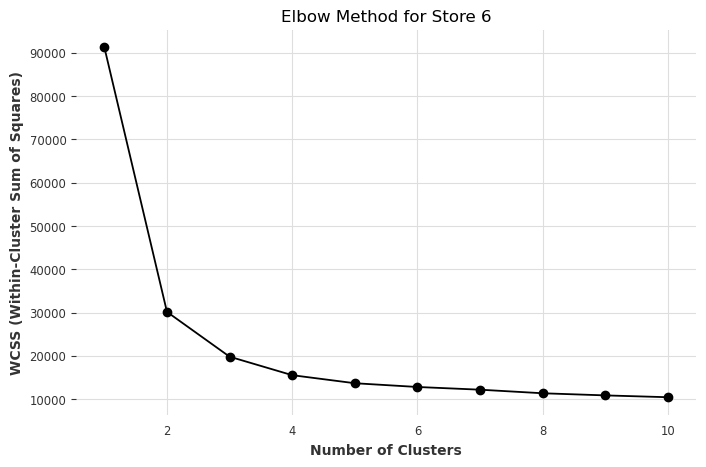

Enter the optimal number of clusters based on the elbow plot:  2


    item  cluster
0      1        0
1      2        1
2      3        0
3      4        0
4      5        0
5      6        1
6      7        1
7      8        1
8      9        0
9     10        1
10    11        1
11    12        1
12    13        1
13    14        1
14    15        1
15    16        0
16    17        0
17    18        1
18    19        0
19    20        0
20    21        0
21    22        1
22    23        0
23    24        1
24    25        1
25    26        0
26    27        0
27    28        1
28    29        1
29    30        0
30    31        1
31    32        0
32    33        1
33    34        0
34    35        1
35    36        1
36    37        0
37    38        1
38    39        0
39    40        0
40    41        0
41    42        0
42    43        0
43    44        0
44    45        1
45    46        1
46    47        0
47    48        0
48    49        0
49    50        1


C:\Users\au_wa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [33]:
cluster_result_6 = cluster_item_by_store(df_train, store_id=6)
print(cluster_result_6)

In [34]:
def check_item_cluster_consistency(cluster_sets):

    item_clusters = {}
    for i, df in enumerate(cluster_sets):
        for _, row in df.iterrows():
            item = row['item']
            cluster = row['cluster']
            if item not in item_clusters:
                item_clusters[item] = []
            item_clusters[item].append(cluster)

    inconsistent_items = []
    for item, clusters in item_clusters.items():
        if len(set(clusters)) > 1:
            inconsistent_items.append(item)

    return inconsistent_items

In [35]:
cluster_sets = [cluster_result_1, cluster_result_2, cluster_result_3, cluster_result_4, cluster_result_5, cluster_result_6, cluster_result_7,cluster_result_8,cluster_result_10]
inconsistent_results = check_item_cluster_consistency(cluster_sets)
print(inconsistent_results)

[]


In [36]:
def split_by_cluster(df):
    cluster_groups = {}
    
    # Get unique clusters
    unique_clusters = df["cluster"].unique()

    for cluster in unique_clusters:
        cluster_groups[cluster] = df[df["cluster"] == cluster]
    
    return cluster_groups

In [37]:
df_train = df_train.merge(cluster_result_1, on="item", how="left")
print(df_train)

             date  store  item  sales  cluster
0      2013-01-01      1     1     13        0
1      2013-01-02      1     1     11        0
2      2013-01-03      1     1     14        0
3      2013-01-04      1     1     13        0
4      2013-01-05      1     1     10        0
...           ...    ...   ...    ...      ...
912995 2017-12-27     10    50     63        1
912996 2017-12-28     10    50     59        1
912997 2017-12-29     10    50     74        1
912998 2017-12-30     10    50     62        1
912999 2017-12-31     10    50     82        1

[913000 rows x 5 columns]


In [38]:
# Split dataset by cluster
clusters = split_by_cluster(df_train)

# Access datasets for each cluster
df_cluster_0 = clusters[0].copy()  # Items in Cluster 0
df_cluster_1 = clusters[1].copy()  # Items in Cluster 1

# Check the shape of each cluster
print("Cluster 0:", df_cluster_0.shape)
print("Cluster 1:", df_cluster_1.shape)

Cluster 0: (474760, 5)
Cluster 1: (438240, 5)


In [39]:
print(df_cluster_0)

             date  store  item  sales  cluster
0      2013-01-01      1     1     13        0
1      2013-01-02      1     1     11        0
2      2013-01-03      1     1     14        0
3      2013-01-04      1     1     13        0
4      2013-01-05      1     1     10        0
...           ...    ...   ...    ...      ...
894735 2017-12-27     10    49     24        0
894736 2017-12-28     10    49     29        0
894737 2017-12-29     10    49     26        0
894738 2017-12-30     10    49     40        0
894739 2017-12-31     10    49     42        0

[474760 rows x 5 columns]


In [40]:
def check_cluster_correlation(cluster_df, cluster_name):

    # Pivot the DataFrame to create a matrix of sales by date and item
    pivot_df = cluster_df.pivot_table(index="date", columns='store', values='sales')

    # Calculate the correlation matrix
    corr_matrix = pivot_df.corr()

    # Visualize the correlation matrix
    plt.figure(figsize=(5, 4))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title(f"Correlation Matrix - {cluster_name}")
    plt.show()



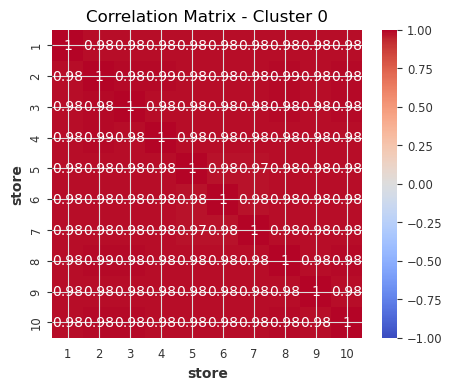

In [41]:
check_cluster_correlation(df_cluster_0, "Cluster 0")

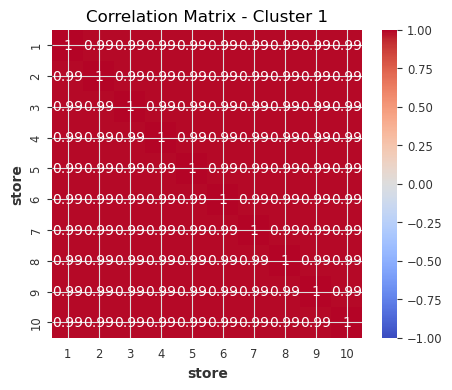

In [42]:
check_cluster_correlation(df_cluster_1, "Cluster 1")

In [126]:
def preprocess_data(df):
    df = df.copy()  
    
    # Convert 'date' column to datetime format
    df["date"] = pd.to_datetime(df["date"])
    
    # Extract date features
    df["year"] = df["date"].dt.year
    df["month"] = df["date"].dt.month
    df["day"] = df["date"].dt.day
    df["day_of_week"] = df["date"].dt.dayofweek  # Monday=0, Sunday=6
    df["week_of_year"] = df["date"].dt.isocalendar().week

    # Create lag features
    df['lag_1'] = df.groupby(['store', 'item'])['sales'].shift(1)
    df['lag_7'] = df.groupby(['store', 'item'])['sales'].shift(7)
    
    # Rolling mean feature
    df['rolling_mean_7'] = df.groupby('store')['sales'].rolling(window=7).mean().shift(1).reset_index(drop=True)

    return df

In [44]:
df_cluster_1 = preprocess_data(df_cluster_1)
print(df_cluster_1)

             date  store  item  sales  cluster  year  month  day  day_of_week  \
18260  2013-01-01      1     2     33        1  2013      1    1            1   
18261  2013-01-02      1     2     43        1  2013      1    2            2   
18262  2013-01-03      1     2     23        1  2013      1    3            3   
18263  2013-01-04      1     2     18        1  2013      1    4            4   
18264  2013-01-05      1     2     34        1  2013      1    5            5   
...           ...    ...   ...    ...      ...   ...    ...  ...          ...   
912995 2017-12-27     10    50     63        1  2017     12   27            2   
912996 2017-12-28     10    50     59        1  2017     12   28            3   
912997 2017-12-29     10    50     74        1  2017     12   29            4   
912998 2017-12-30     10    50     62        1  2017     12   30            5   
912999 2017-12-31     10    50     82        1  2017     12   31            6   

        week_of_year  lag_1

In [45]:
df_cluster_0 = preprocess_data(df_cluster_0)
print(df_cluster_0)

             date  store  item  sales  cluster  year  month  day  day_of_week  \
0      2013-01-01      1     1     13        0  2013      1    1            1   
1      2013-01-02      1     1     11        0  2013      1    2            2   
2      2013-01-03      1     1     14        0  2013      1    3            3   
3      2013-01-04      1     1     13        0  2013      1    4            4   
4      2013-01-05      1     1     10        0  2013      1    5            5   
...           ...    ...   ...    ...      ...   ...    ...  ...          ...   
894735 2017-12-27     10    49     24        0  2017     12   27            2   
894736 2017-12-28     10    49     29        0  2017     12   28            3   
894737 2017-12-29     10    49     26        0  2017     12   29            4   
894738 2017-12-30     10    49     40        0  2017     12   30            5   
894739 2017-12-31     10    49     42        0  2017     12   31            6   

        week_of_year  lag_1

In [46]:
df_cluster_0 = df_cluster_0.set_index('date')  # Set 'date' as index
df_cluster_0.index = pd.to_datetime(df_cluster_0.index)
print(df_cluster_0)

            store  item  sales  cluster  year  month  day  day_of_week  \
date                                                                     
2013-01-01      1     1     13        0  2013      1    1            1   
2013-01-02      1     1     11        0  2013      1    2            2   
2013-01-03      1     1     14        0  2013      1    3            3   
2013-01-04      1     1     13        0  2013      1    4            4   
2013-01-05      1     1     10        0  2013      1    5            5   
...           ...   ...    ...      ...   ...    ...  ...          ...   
2017-12-27     10    49     24        0  2017     12   27            2   
2017-12-28     10    49     29        0  2017     12   28            3   
2017-12-29     10    49     26        0  2017     12   29            4   
2017-12-30     10    49     40        0  2017     12   30            5   
2017-12-31     10    49     42        0  2017     12   31            6   

            week_of_year  lag_1  lag_

In [47]:
df_cluster_1 = df_cluster_1.set_index('date')  # Set 'date' as index
df_cluster_1.index = pd.to_datetime(df_cluster_1.index)
print(df_cluster_1)

            store  item  sales  cluster  year  month  day  day_of_week  \
date                                                                     
2013-01-01      1     2     33        1  2013      1    1            1   
2013-01-02      1     2     43        1  2013      1    2            2   
2013-01-03      1     2     23        1  2013      1    3            3   
2013-01-04      1     2     18        1  2013      1    4            4   
2013-01-05      1     2     34        1  2013      1    5            5   
...           ...   ...    ...      ...   ...    ...  ...          ...   
2017-12-27     10    50     63        1  2017     12   27            2   
2017-12-28     10    50     59        1  2017     12   28            3   
2017-12-29     10    50     74        1  2017     12   29            4   
2017-12-30     10    50     62        1  2017     12   30            5   
2017-12-31     10    50     82        1  2017     12   31            6   

            week_of_year  lag_1  lag_

In [48]:
df_cluster_0.loc[:, :] = df_cluster_0.fillna(0)

In [49]:
df_cluster_1.loc[:, :] = df_cluster_1.fillna(0)

In [50]:
print(df_cluster_0)

            store  item  sales  cluster  year  month  day  day_of_week  \
date                                                                     
2013-01-01      1     1     13        0  2013      1    1            1   
2013-01-02      1     1     11        0  2013      1    2            2   
2013-01-03      1     1     14        0  2013      1    3            3   
2013-01-04      1     1     13        0  2013      1    4            4   
2013-01-05      1     1     10        0  2013      1    5            5   
...           ...   ...    ...      ...   ...    ...  ...          ...   
2017-12-27     10    49     24        0  2017     12   27            2   
2017-12-28     10    49     29        0  2017     12   28            3   
2017-12-29     10    49     26        0  2017     12   29            4   
2017-12-30     10    49     40        0  2017     12   30            5   
2017-12-31     10    49     42        0  2017     12   31            6   

            week_of_year  lag_1  lag_

In [56]:
import torch.optim.lr_scheduler as lr_scheduler 
import torchmetrics
from pytorch_lightning.loggers import TensorBoardLogger

def train_and_evaluate_TFT_models_0(train_df,valtest_df,freq="D"):

    model = TFTModel(
                    input_chunk_length=90,
                    output_chunk_length=90,
                    n_epochs=10,
                    batch_size=12,
                    add_relative_index=True,
                    lr_scheduler_cls=lr_scheduler.ReduceLROnPlateau,
                    lr_scheduler_kwargs={
                        "mode": "min",
                        "factor": 0.5,
                        "patience": 2,
                        "verbose": True,
                    },
                    torch_metrics=torchmetrics.MetricCollection([
                        torchmetrics.MeanSquaredError(squared=False),
                        torchmetrics.MeanAbsoluteError(),
                        torchmetrics.MeanAbsolutePercentageError(),
                        torchmetrics.R2Score()
                    ]),
                    log_tensorboard=True, # enable logging
                    pl_trainer_kwargs={"logger": TensorBoardLogger(save_dir="logs/")}, 
                )

    model.fit(series=train_df,val_series=valtest_df, past_covariates=None, future_covariates=None)

    validation_metrics = model.trainer.callback_metrics
    val_rmse = validation_metrics.get("val_MeanSquaredError", None)
    val_mae = validation_metrics.get("val_MeanAbsoluteError", None)
    val_mape = validation_metrics.get("val_MeanAbsolutePercentageError", None)
    val_r2 = validation_metrics.get("val_R2Score", None)

    print(f"Validation RMSE: {val_rmse}")
    print(f"Validation MAE: {val_mae}")
    print(f"Validation MAPE: {val_mape}")
    print(f"Validation R-squared: {val_r2}")
 
    return model


In [52]:
import numpy as np

df_train_clean_cut = df_cluster_0
df_train_clean_cut["sales"] = np.clip(df_train_clean_cut["sales"], lower_bound, upper_bound)

In [53]:
def change_to_timeseries(train_df,freq="D"):

    data_variates = TimeSeries.from_dataframe(train_df, value_cols=['sales'], fill_missing_dates=True, freq=freq)
    print(data_variates)
    return data_variates

In [92]:
from darts import concatenate

train_df_0 = df_train_clean_cut[df_train_clean_cut.index.year < 2017]
valtest_df_0 = df_train_clean_cut[df_train_clean_cut.index.year == 2017]

total_train_cluster_0 = None
total_val_cluster_0 = None

store_item_mapping_0 = []  # List to store (store, item)

for (store_id, item_id), group_df_0 in train_df_0.groupby(["store", "item"]):
        print(f"Processing Store {store_id}, Item {item_id}...")
        data_covariates = change_to_timeseries(group_df_0)
    
        if total_train_cluster_0 is None:
            total_train_cluster_0 = data_covariates
            store_item_mapping_0.append((store_id, item_id))
        else:
            total_train_cluster_0 = concatenate([total_train_cluster_0, data_covariates], axis=1)
            store_item_mapping_0.append((store_id, item_id))

for (store_id, item_id), group_val_0 in valtest_df_0.groupby(["store", "item"]):
        print(f"Processing Store {store_id}, Item {item_id}...")
        data_val_covariates = change_to_timeseries(group_val_0)
    
        if total_val_cluster_0 is None:
            total_val_cluster_0 = data_val_covariates
        else:
            total_val_cluster_0 = concatenate([total_val_cluster_0, data_val_covariates], axis=1)

Processing Store 1, Item 1...
<TimeSeries (DataArray) (date: 1461, component: 1, sample: 1)>
array([[[13.]],

       [[11.]],

       [[14.]],

       ...,

       [[21.]],

       [[24.]],

       [[14.]]])
Coordinates:
  * date       (date) datetime64[ns] 2013-01-01 2013-01-02 ... 2016-12-31
  * component  (component) object 'sales'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarchy:          None
Processing Store 1, Item 3...
<TimeSeries (DataArray) (date: 1461, component: 1, sample: 1)>
array([[[15.]],

       [[30.]],

       [[14.]],

       ...,

       [[26.]],

       [[26.]],

       [[29.]]])
Coordinates:
  * date       (date) datetime64[ns] 2013-01-01 2013-01-02 ... 2016-12-31
  * component  (component) object 'sales'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarchy:          None
Processing Store 1, Item 4...
<TimeSeries (DataArray) (date: 1461, component: 1, sample: 1)>
array([[[10.]],

In [58]:
model_TFT_0 = train_and_evaluate_TFT_models_0(total_train_cluster_0,total_val_cluster_0)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
C:\Users\au_wa\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

   | Name                              | Type                             | Params | Mode 
------------------------------------------------------------------------------------------------
0  | train_metrics                     | MetricCollection                 | 0      | train
1  | val_metrics                       | MetricCollection                 | 0      | train
2  | input_embeddings                  | _MultiEmbedding                  | 0      | train
3  | static_covariates_vsn             | _VariableSelectionNetwork        | 0      | train
4  | encoder_vsn                       | _VariableSelectionNetwork        | 181 K  | train
5  | decoder_vsn                       | _Variabl

Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=10` reached.


Validation RMSE: 16.904682159423828
Validation MAE: 12.953359603881836
Validation MAPE: 0.2989500164985657
Validation R-squared: -1.7890588685389592


In [62]:
import torch.optim.lr_scheduler as lr_scheduler 
import torchmetrics
from pytorch_lightning.loggers import TensorBoardLogger

def train_and_evaluate_TFT_models_1(train_df,valtest_df, freq="D"):

    model = TFTModel(
                    input_chunk_length=90,
                    output_chunk_length=90,
                    n_epochs=16,
                    batch_size=15,
                    add_relative_index=True,
                    lr_scheduler_cls=lr_scheduler.ReduceLROnPlateau,
                    lr_scheduler_kwargs={
                        "mode": "min",
                        "factor": 0.5,
                        "patience": 2,
                        "verbose": True,
                    },
                    torch_metrics=torchmetrics.MetricCollection([
                        torchmetrics.MeanSquaredError(squared=False),
                        torchmetrics.MeanAbsoluteError(),
                        torchmetrics.MeanAbsolutePercentageError(),
                        torchmetrics.R2Score()
                    ]),
                    log_tensorboard=True, # enable logging
                    pl_trainer_kwargs={"logger": TensorBoardLogger(save_dir="logs/")}, 
                )

    model.fit(series=train_df,val_series=valtest_df, past_covariates=None, future_covariates=None)

    validation_metrics = model.trainer.callback_metrics
    val_rmse = validation_metrics.get("val_MeanSquaredError", None)
    val_mae = validation_metrics.get("val_MeanAbsoluteError", None)
    val_mape = validation_metrics.get("val_MeanAbsolutePercentageError", None)
    val_r2 = validation_metrics.get("val_R2Score", None)

    print(f"Validation RMSE: {val_rmse}")
    print(f"Validation MAE: {val_mae}")
    print(f"Validation MAPE: {val_mape}")
    print(f"Validation R-squared: {val_r2}")
 
    return model


In [64]:
df_train_clean_cut_1 = df_cluster_1
#df_train_clean_cut_1["sales"] = np.clip(df_train_clean_cut_1["sales"], lower_bound, upper_bound)

In [94]:
train_df_1 = df_train_clean_cut_1[df_train_clean_cut_1.index.year < 2017]
valtest_df_1 = df_train_clean_cut_1[df_train_clean_cut_1.index.year == 2017]

total_train_cluster_1 = None
total_val_cluster_1 = None
store_item_mapping_1 = []

for (store_id, item_id), group_df_1 in train_df_1.groupby(["store", "item"]):
        print(f"Processing Store {store_id}, Item {item_id}...")
        data_covariates = change_to_timeseries(group_df_1)
    
        if total_train_cluster_1 is None:
            total_train_cluster_1 = data_covariates
            store_item_mapping_1.append((store_id, item_id))
        else:
            total_train_cluster_1 = concatenate([total_train_cluster_1, data_covariates], axis=1)
            store_item_mapping_1.append((store_id, item_id))

for (store_id, item_id), group_val_1 in valtest_df_1.groupby(["store", "item"]):
        print(f"Processing Store {store_id}, Item {item_id}...")
        data_val_covariates = change_to_timeseries(group_val_1)
    
        if total_val_cluster_1 is None:
            total_val_cluster_1 = data_val_covariates
            store_item_mapping_1.append((store_id, item_id))
        else:
            total_val_cluster_1 = concatenate([total_val_cluster_1, data_val_covariates], axis=1)
            store_item_mapping_1.append((store_id, item_id))

Processing Store 1, Item 2...
<TimeSeries (DataArray) (date: 1461, component: 1, sample: 1)>
array([[[33.]],

       [[43.]],

       [[23.]],

       ...,

       [[56.]],

       [[37.]],

       [[47.]]])
Coordinates:
  * date       (date) datetime64[ns] 2013-01-01 2013-01-02 ... 2016-12-31
  * component  (component) object 'sales'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarchy:          None
Processing Store 1, Item 6...
<TimeSeries (DataArray) (date: 1461, component: 1, sample: 1)>
array([[[31.]],

       [[36.]],

       [[18.]],

       ...,

       [[46.]],

       [[54.]],

       [[53.]]])
Coordinates:
  * date       (date) datetime64[ns] 2013-01-01 2013-01-02 ... 2016-12-31
  * component  (component) object 'sales'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarchy:          None
Processing Store 1, Item 7...
<TimeSeries (DataArray) (date: 1461, component: 1, sample: 1)>
array([[[25.]],

In [67]:
model_TFT_1 = train_and_evaluate_TFT_models_1(total_train_cluster_1,total_val_cluster_1)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
C:\Users\au_wa\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

   | Name                              | Type                             | Params | Mode 
------------------------------------------------------------------------------------------------
0  | train_metrics                     | MetricCollection                 | 0      | train
1  | val_metrics                       | MetricCollection                 | 0      | train
2  | input_embeddings                  | _MultiEmbedding                  | 0      | train
3  | static_covariates_vsn             | _VariableSelectionNetwork        | 0      | train
4  | encoder_vsn                       | _VariableSelectionNetwork        | 168 K  | train
5  | decoder_vsn                       | _Variabl

Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=16` reached.


Validation RMSE: 31.94487762451172
Validation MAE: 25.20703125
Validation MAPE: 0.26847225427627563
Validation R-squared: -2.1827566187014686


In [74]:
def train_and_evaluate_NBEATS_models_0(train_df, valtest_df, freq="D"):

    rmse = torchmetrics.MeanSquaredError(squared=False)
    mae = torchmetrics.MeanAbsoluteError()
    mape = torchmetrics.MeanAbsolutePercentageError()
    r2 = torchmetrics.R2Score()

    model = NBEATSModel(
        input_chunk_length=90,
        output_chunk_length=90,
        n_epochs=10,
        batch_size=12,
        lr_scheduler_cls=lr_scheduler.ReduceLROnPlateau,
        lr_scheduler_kwargs={
            "mode": "min",
            "factor": 0.5,
            "patience": 2,
            "verbose": True,
        },
        torch_metrics=torchmetrics.MetricCollection([rmse, mae, mape, r2]),
        log_tensorboard=True,
        pl_trainer_kwargs={"logger": TensorBoardLogger(save_dir="logs/")},
    )

    model.fit(series=train_df, val_series=valtest_df, past_covariates=None, future_covariates=None)

    validation_metrics = model.trainer.callback_metrics
    val_rmse = validation_metrics.get("val_MeanSquaredError", None)
    val_mae = validation_metrics.get("val_MeanAbsoluteError", None)
    val_mape = validation_metrics.get("val_MeanAbsolutePercentageError", None)
    val_r2 = validation_metrics.get("val_R2Score", None)

    print(f"Validation RMSE: {val_rmse}")
    print(f"Validation MAE: {val_mae}")
    print(f"Validation MAPE: {val_mape}")
    print(f"Validation R-squared: {val_r2}")

    return model

In [76]:
model_NBeats_0 = train_and_evaluate_NBEATS_models_0(total_train_cluster_0,total_val_cluster_0)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
C:\Users\au_wa\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 194 M  | train
-------------------------------------------------------------
194 M     Trainable params
141 K     Non-trainable params
194 M     Total params
776.568   Total estimated model params size (MB)
404       Modules in train mode
0         Modu

Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=10` reached.


Validation RMSE: 10.076151847839355
Validation MAE: 7.749449729919434
Validation MAPE: 0.20076526701450348
Validation R-squared: -0.05475637155614128


In [80]:
def train_and_evaluate_NBEATS_models_1(train_df, valtest_df, freq="D"):

    rmse = torchmetrics.MeanSquaredError(squared=False)
    mae = torchmetrics.MeanAbsoluteError()
    mape = torchmetrics.MeanAbsolutePercentageError()
    r2 = torchmetrics.R2Score()

    model = NBEATSModel(
        input_chunk_length=90,
        output_chunk_length=90,
        n_epochs=10,
        batch_size=12,
        lr_scheduler_cls=lr_scheduler.ReduceLROnPlateau,
        lr_scheduler_kwargs={
            "mode": "min",
            "factor": 0.5,
            "patience": 2,
            "verbose": True,
        },
        torch_metrics=torchmetrics.MetricCollection([rmse, mae, mape, r2]),
        log_tensorboard=True,
        pl_trainer_kwargs={"logger": TensorBoardLogger(save_dir="logs/")},
    )

    model.fit(series=train_df, val_series=valtest_df, past_covariates=None, future_covariates=None)

    validation_metrics = model.trainer.callback_metrics
    val_rmse = validation_metrics.get("val_MeanSquaredError", None)
    val_mae = validation_metrics.get("val_MeanAbsoluteError", None)
    val_mape = validation_metrics.get("val_MeanAbsolutePercentageError", None)
    val_r2 = validation_metrics.get("val_R2Score", None)

    print(f"Validation RMSE: {val_rmse}")
    print(f"Validation MAE: {val_mae}")
    print(f"Validation MAPE: {val_mape}")
    print(f"Validation R-squared: {val_r2}")

    return model

In [82]:
model_NBeats_1 = train_and_evaluate_NBEATS_models_1(total_train_cluster_1,total_val_cluster_1)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
C:\Users\au_wa\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 179 M  | train
-------------------------------------------------------------
179 M     Trainable params
130 K     Non-trainable params
179 M     Total params
718.680   Total estimated model params size (MB)
404       Modules in train mode
0         Modu

Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=10` reached.


Validation RMSE: 16.870386123657227
Validation MAE: 13.297143936157227
Validation MAPE: 0.15580256283283234
Validation R-squared: 0.08303372426099112


In [84]:
# Generate predictions
prediction_TFT_0 = model_TFT_0.predict(n=90)

# Extract predicted values
prediction_TFT_values_0 = prediction_TFT_0.pd_dataframe()

print(prediction_TFT_values_0)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                    | 0/? [00:00<…

component       sales    sales_1  sales_1_1  sales_1_1_1  sales_1_1_1_1  \
date                                                                      
2017-01-01  17.954806  41.617861  15.526411    16.122964      52.851416   
2017-01-02  17.939260  18.967084  18.158507    10.682434      55.506862   
2017-01-03  20.488811  38.529599  26.829835    14.860274      49.681715   
2017-01-04   6.928232  41.054713  23.771055    19.207816      55.615913   
2017-01-05  22.696840  29.353993  24.667558    19.694842      35.183373   
...               ...        ...        ...          ...            ...   
2017-03-27  21.328991  35.579889  33.372306    22.633471      24.828840   
2017-03-28  11.982399  45.313829  34.034647    16.376461      43.799903   
2017-03-29  23.585180  41.470307  12.214674    15.818021      41.836882   
2017-03-30  24.604387  44.994938  16.344376     7.013141      50.539092   
2017-03-31  22.265044  40.528731  31.225213    18.019809      30.410197   

component   sales_1_1_1_

In [120]:
# Generate predictions
prediction_TFT_1 = model_TFT_1.predict(n=90)

# Extract predicted values
prediction_TFT_values_1 = prediction_TFT_1.pd_dataframe()

print(prediction_TFT_values_1)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                    | 0/? [00:00<…

component       sales    sales_1  sales_1_1  sales_1_1_1  sales_1_1_1_1  \
date                                                                      
2017-01-01  34.599025  55.750445  61.675284    80.818910      66.725412   
2017-01-02  45.942915  41.893948  48.267902    45.466148      84.884860   
2017-01-03  53.762380  51.120126  46.276512    63.869612      72.517529   
2017-01-04  53.826132  75.411003  53.355995    53.108971      72.423743   
2017-01-05  61.648467  44.720142  72.257549    73.177688      62.831189   
...               ...        ...        ...          ...            ...   
2017-03-27  40.321710  74.544734  63.190112    72.727933      80.667034   
2017-03-28  65.887075  39.304033  56.385446    82.762983      74.324812   
2017-03-29  48.171818  53.803483  49.685664    76.115014      51.813054   
2017-03-30  36.078844  73.104128  39.617113    55.527519      49.210002   
2017-03-31  59.838579  69.462922  38.734635    81.513455      67.460645   

component   sales_1_1_1_

In [88]:
# Generate predictions
prediction_NBeat_0 = model_NBeats_0.predict(n=90)

# Extract predicted values
prediction_NBeat_values_0 = prediction_NBeat_0.pd_dataframe()

print(prediction_NBeat_values_0)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                    | 0/? [00:00<…

component       sales    sales_1  sales_1_1  sales_1_1_1  sales_1_1_1_1  \
date                                                                      
2017-01-01  15.989512  33.540824  15.873468    18.839425      46.777334   
2017-01-02  21.430565  34.945954  17.653919    13.100670      50.342157   
2017-01-03  21.131200  33.836403  20.695400    14.742991      49.846568   
2017-01-04  21.710777  34.068362  16.432736    20.413872      48.608367   
2017-01-05  20.154259  31.229986  17.500048    18.903050      45.413345   
...               ...        ...        ...          ...            ...   
2017-03-27  20.169298  28.853025  16.457633    14.048662      46.232808   
2017-03-28  16.824303  30.214439  16.773259    14.408055      40.521764   
2017-03-29  19.700143  31.120091  21.007807    13.551126      44.436546   
2017-03-30  19.532570  34.018091  18.019538    17.043710      45.031453   
2017-03-31  18.031549  30.162413  17.334015    16.081370      43.899573   

component   sales_1_1_1_

In [118]:
# Generate predictions
prediction_NBeat_1 = model_NBeats_1.predict(n=90)

# Extract predicted values
prediction_NBeat_values_1 = prediction_NBeat_1.pd_dataframe()

print(prediction_NBeat_values_1)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                    | 0/? [00:00<…

component       sales    sales_1  sales_1_1  sales_1_1_1  sales_1_1_1_1  \
date                                                                      
2017-01-01  51.856358  51.880936  49.810377    63.884482      54.908557   
2017-01-02  49.066321  49.456424  52.949440    67.584796      54.247974   
2017-01-03  45.724416  52.427131  45.436833    57.598927      61.479786   
2017-01-04  49.754876  49.073991  47.416586    66.698468      59.387021   
2017-01-05  46.314212  50.485873  50.797957    63.736041      59.612222   
...               ...        ...        ...          ...            ...   
2017-03-27  47.942717  44.972110  46.203088    63.801164      63.619787   
2017-03-28  45.226430  47.047648  49.654830    55.915194      60.920842   
2017-03-29  46.767534  49.038083  50.607027    65.291388      61.819694   
2017-03-30  45.352059  46.535095  51.063759    64.213830      55.657966   
2017-03-31  48.581853  47.506864  51.917722    63.005721      62.092453   

component   sales_1_1_1_

In [98]:
print(store_item_mapping_0)

[(1, 1), (1, 3), (1, 4), (1, 5), (1, 9), (1, 16), (1, 17), (1, 19), (1, 20), (1, 21), (1, 23), (1, 26), (1, 27), (1, 30), (1, 32), (1, 34), (1, 37), (1, 39), (1, 40), (1, 41), (1, 42), (1, 43), (1, 44), (1, 47), (1, 48), (1, 49), (2, 1), (2, 3), (2, 4), (2, 5), (2, 9), (2, 16), (2, 17), (2, 19), (2, 20), (2, 21), (2, 23), (2, 26), (2, 27), (2, 30), (2, 32), (2, 34), (2, 37), (2, 39), (2, 40), (2, 41), (2, 42), (2, 43), (2, 44), (2, 47), (2, 48), (2, 49), (3, 1), (3, 3), (3, 4), (3, 5), (3, 9), (3, 16), (3, 17), (3, 19), (3, 20), (3, 21), (3, 23), (3, 26), (3, 27), (3, 30), (3, 32), (3, 34), (3, 37), (3, 39), (3, 40), (3, 41), (3, 42), (3, 43), (3, 44), (3, 47), (3, 48), (3, 49), (4, 1), (4, 3), (4, 4), (4, 5), (4, 9), (4, 16), (4, 17), (4, 19), (4, 20), (4, 21), (4, 23), (4, 26), (4, 27), (4, 30), (4, 32), (4, 34), (4, 37), (4, 39), (4, 40), (4, 41), (4, 42), (4, 43), (4, 44), (4, 47), (4, 48), (4, 49), (5, 1), (5, 3), (5, 4), (5, 5), (5, 9), (5, 16), (5, 17), (5, 19), (5, 20), (5, 21)

In [112]:
column_names_1 = {}
for i, (store_id, item_id) in enumerate(store_item_mapping_1):
    original_column_name = f"sales_{'_'.join(map(str, [1] * i))}" if i > 0 else "sales"
    new_column_name = f"store_{store_id}_item_{item_id}"
    column_names_1[original_column_name] = new_column_name
print(column_names_1)

{'sales': 'store_1_item_2', 'sales_1': 'store_1_item_6', 'sales_1_1': 'store_1_item_7', 'sales_1_1_1': 'store_1_item_8', 'sales_1_1_1_1': 'store_1_item_10', 'sales_1_1_1_1_1': 'store_1_item_11', 'sales_1_1_1_1_1_1': 'store_1_item_12', 'sales_1_1_1_1_1_1_1': 'store_1_item_13', 'sales_1_1_1_1_1_1_1_1': 'store_1_item_14', 'sales_1_1_1_1_1_1_1_1_1': 'store_1_item_15', 'sales_1_1_1_1_1_1_1_1_1_1': 'store_1_item_18', 'sales_1_1_1_1_1_1_1_1_1_1_1': 'store_1_item_22', 'sales_1_1_1_1_1_1_1_1_1_1_1_1': 'store_1_item_24', 'sales_1_1_1_1_1_1_1_1_1_1_1_1_1': 'store_1_item_25', 'sales_1_1_1_1_1_1_1_1_1_1_1_1_1_1': 'store_1_item_28', 'sales_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1': 'store_1_item_29', 'sales_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1': 'store_1_item_31', 'sales_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1': 'store_1_item_33', 'sales_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1': 'store_1_item_35', 'sales_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1': 'store_1_item_36', 'sales_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1_1': 'store_1_item_

In [ ]:
column_names = {}
for i, (store_id, item_id) in enumerate(store_item_mapping_0):
    original_column_name = f"sales_{'_'.join(map(str, [1] * i))}" if i > 0 else "sales"
    new_column_name = f"store_{store_id}_item_{item_id}"
    column_names[original_column_name] = new_column_name

In [104]:
prediction_TFT_values_0 = prediction_TFT_values_0.rename(columns=column_names)

print(prediction_TFT_values_0)

component   store_1_item_1  store_1_item_3  store_1_item_4  store_1_item_5  \
date                                                                         
2017-01-01       17.954806       41.617861       15.526411       16.122964   
2017-01-02       17.939260       18.967084       18.158507       10.682434   
2017-01-03       20.488811       38.529599       26.829835       14.860274   
2017-01-04        6.928232       41.054713       23.771055       19.207816   
2017-01-05       22.696840       29.353993       24.667558       19.694842   
...                    ...             ...             ...             ...   
2017-03-27       21.328991       35.579889       33.372306       22.633471   
2017-03-28       11.982399       45.313829       34.034647       16.376461   
2017-03-29       23.585180       41.470307       12.214674       15.818021   
2017-03-30       24.604387       44.994938       16.344376        7.013141   
2017-03-31       22.265044       40.528731       31.225213      

In [122]:
prediction_TFT_values_1 = prediction_TFT_values_1.rename(columns=column_names_1)

print(prediction_TFT_values_1)

component   store_1_item_2  store_1_item_6  store_1_item_7  store_1_item_8  \
date                                                                         
2017-01-01       34.599025       55.750445       61.675284       80.818910   
2017-01-02       45.942915       41.893948       48.267902       45.466148   
2017-01-03       53.762380       51.120126       46.276512       63.869612   
2017-01-04       53.826132       75.411003       53.355995       53.108971   
2017-01-05       61.648467       44.720142       72.257549       73.177688   
...                    ...             ...             ...             ...   
2017-03-27       40.321710       74.544734       63.190112       72.727933   
2017-03-28       65.887075       39.304033       56.385446       82.762983   
2017-03-29       48.171818       53.803483       49.685664       76.115014   
2017-03-30       36.078844       73.104128       39.617113       55.527519   
2017-03-31       59.838579       69.462922       38.734635      

In [108]:
prediction_NBeat_values_0 = prediction_NBeat_values_0.rename(columns=column_names)

print(prediction_NBeat_values_0)

component   store_1_item_1  store_1_item_3  store_1_item_4  store_1_item_5  \
date                                                                         
2017-01-01       15.989512       33.540824       15.873468       18.839425   
2017-01-02       21.430565       34.945954       17.653919       13.100670   
2017-01-03       21.131200       33.836403       20.695400       14.742991   
2017-01-04       21.710777       34.068362       16.432736       20.413872   
2017-01-05       20.154259       31.229986       17.500048       18.903050   
...                    ...             ...             ...             ...   
2017-03-27       20.169298       28.853025       16.457633       14.048662   
2017-03-28       16.824303       30.214439       16.773259       14.408055   
2017-03-29       19.700143       31.120091       21.007807       13.551126   
2017-03-30       19.532570       34.018091       18.019538       17.043710   
2017-03-31       18.031549       30.162413       17.334015      

In [124]:
prediction_NBeat_values_1 = prediction_NBeat_values_1.rename(columns=column_names_1)

print(prediction_NBeat_values_1)

component   store_1_item_2  store_1_item_6  store_1_item_7  store_1_item_8  \
date                                                                         
2017-01-01       51.856358       51.880936       49.810377       63.884482   
2017-01-02       49.066321       49.456424       52.949440       67.584796   
2017-01-03       45.724416       52.427131       45.436833       57.598927   
2017-01-04       49.754876       49.073991       47.416586       66.698468   
2017-01-05       46.314212       50.485873       50.797957       63.736041   
...                    ...             ...             ...             ...   
2017-03-27       47.942717       44.972110       46.203088       63.801164   
2017-03-28       45.226430       47.047648       49.654830       55.915194   
2017-03-29       46.767534       49.038083       50.607027       65.291388   
2017-03-30       45.352059       46.535095       51.063759       64.213830   
2017-03-31       48.581853       47.506864       51.917722      